## Final Project - Shafya Nadour, Will Berritt, Jonathan Burns

### Project Overview and Methodology:
For the final project our group wanted to dive into one of the largest global industries and evaluate just how concentrated it is. 
Using networkx and network analysis algorithms the group sought out to see if we can we pull any insight out of the data about the gaming industry.
Lastly, we will use a Louvain Algorithm to evalute several different features within the data and generate communities from that.

Pull in the two video game production datasets from github

In [28]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

### Data Source Outline

* The data for this project comes directly from Kaggle, and the two sources listed below are utilized to create a full view of the industry. The Video Game Sales df (first link) features most of the data we will be using in this project. 
* We get (Rank, video game name, publisher name, platform, genre and publishing year). From there, goining on the publisher name (developer name in the second dataset) we were able to pull in the primary county of residence for publishers. 
* Note that the publisher data and developer data have slightly different names in some cases so there isnt a full 1:1 match between the data.

* https://www.kaggle.com/datasets/gregorut/videogamesales
* https://www.kaggle.com/datasets/andreshg/videogamescompaniesregions?select=video-games-developers.csv

In [29]:
# Import the data
vg_devs = pd.read_csv('https://raw.githubusercontent.com/jonburns2454/Data-620/master/DATA/video_game_data.csv')
vg_country = pd.read_csv('https://raw.githubusercontent.com/jonburns2454/Data-620/master/DATA/video-games-developers.csv')

### 1. Cleaning and formatting the dataframes

This data should be cleaned to make network analysis easier down the road.
By making the Year data back into str and dropping NANs this data is good to go for exploratory data analysis.

In [30]:
# First the year columns need to be converted to remove the trailing zeros in the dev and country datasets
vg_devs['Year'] = vg_devs['Year'].fillna(-1).astype(int).astype(str)
#Replace -1 with NaN
vg_devs['Year'] = vg_devs['Year'].replace('-1', 'NaN')

In [31]:
# The year column in the country data set has some weird formatting so we need to take only the first 4 numbers. there are characters and merged cells

vg_country['Est.'] = vg_country['Est.'].astype(str).str.slice(0, 4)
vg_country['Est.'] = pd.to_numeric(vg_country['Est.'], errors='coerce')

vg_country['Est.'] = vg_country['Est.'].fillna(-1).astype(int).astype(str)
#Replace -1 with NaN
vg_country['Est.'] = vg_country['Est.'].replace('-1', 'NaN')
# Replace column name so it is easier to work with and makes more sense
vg_country = vg_country.rename(columns={'Est.': 'year_established'})

In [32]:
# merge the two datasets on the developer name and take the country and year established columns
vg_merge = vg_devs.merge(vg_country[['Developer', 'Country', 'year_established']], how='left', left_on='Publisher', right_on='Developer')

In [33]:
vg_merge.columns

Index(['Rank', 'Name', 'Platform', 'Year', 'Genre', 'Publisher', 'NA_Sales',
       'EU_Sales', 'JP_Sales', 'Other_Sales', 'Global_Sales', 'Developer',
       'Country', 'year_established'],
      dtype='object')

Because the video game production industry is a oligopoly many of the missing values generated from the merge are due to parent companies like Take-Two interactive and Microsoft game studios own numerous of these large gaming companies and they are not present on the dev dataset. Keep this fact in mind moving forward

### 2. Generating exploratory data analysis
* The primary goal of EDA for this project specifically is to breakdown the data and look at sales, counts for platforms, genres and publishers.
* Doing so will help guide our network analysis and further inform our conclusions at the end.

In [34]:
print(vg_merge.head())

   Rank                      Name Platform  Year         Genre Publisher  \
0     1                Wii Sports      Wii  2006        Sports  Nintendo   
1     2         Super Mario Bros.      NES  1985      Platform  Nintendo   
2     3            Mario Kart Wii      Wii  2008        Racing  Nintendo   
3     4         Wii Sports Resort      Wii  2009        Sports  Nintendo   
4     5  Pokemon Red/Pokemon Blue       GB  1996  Role-Playing  Nintendo   

   NA_Sales  EU_Sales  JP_Sales  Other_Sales  Global_Sales Developer Country  \
0     41.49     29.02      3.77         8.46         82.74  Nintendo   Japan   
1     29.08      3.58      6.81         0.77         40.24  Nintendo   Japan   
2     15.85     12.88      3.79         3.31         35.82  Nintendo   Japan   
3     15.75     11.01      3.28         2.96         33.00  Nintendo   Japan   
4     11.27      8.89     10.22         1.00         31.37  Nintendo   Japan   

  year_established  
0             1889  
1             1889  

In [35]:
vg_merge.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16598 entries, 0 to 16597
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Rank              16598 non-null  int64  
 1   Name              16598 non-null  object 
 2   Platform          16598 non-null  object 
 3   Year              16598 non-null  object 
 4   Genre             16598 non-null  object 
 5   Publisher         16540 non-null  object 
 6   NA_Sales          16598 non-null  float64
 7   EU_Sales          16598 non-null  float64
 8   JP_Sales          16598 non-null  float64
 9   Other_Sales       16598 non-null  float64
 10  Global_Sales      16598 non-null  float64
 11  Developer         9195 non-null   object 
 12  Country           9195 non-null   object 
 13  year_established  9195 non-null   object 
dtypes: float64(5), int64(1), object(8)
memory usage: 1.8+ MB


In [36]:
print(vg_merge.describe())

               Rank      NA_Sales      EU_Sales      JP_Sales   Other_Sales  \
count  16598.000000  16598.000000  16598.000000  16598.000000  16598.000000   
mean    8300.605254      0.264667      0.146652      0.077782      0.048063   
std     4791.853933      0.816683      0.505351      0.309291      0.188588   
min        1.000000      0.000000      0.000000      0.000000      0.000000   
25%     4151.250000      0.000000      0.000000      0.000000      0.000000   
50%     8300.500000      0.080000      0.020000      0.000000      0.010000   
75%    12449.750000      0.240000      0.110000      0.040000      0.040000   
max    16600.000000     41.490000     29.020000     10.220000     10.570000   

       Global_Sales  
count  16598.000000  
mean       0.537441  
std        1.555028  
min        0.010000  
25%        0.060000  
50%        0.170000  
75%        0.470000  
max       82.740000  


Frequency across Sales categories:
* Due to the sheer size of the combined North American economies, it makes sense that North American Sales make up nearly 50% of the global sales, followed then by EU and Japan sales.
* Japan sales do seem to be really high compared to the other counties sales. I would imagine this is due to a much higher percentage of the population plays video games maybe?

In [37]:
import pandas as pd

sales_sums = vg_merge[['NA_Sales', 'JP_Sales', 'EU_Sales', 'Other_Sales', 'Global_Sales']].sum()

summary_table = pd.DataFrame(sales_sums, columns=['Total Sales'])
summary_table.index.name = 'Sales Category'

# Calculate the percentage of global sales
summary_table['Percentage of Global Sales'] = (summary_table['Total Sales'] / summary_table.loc['Global_Sales', 'Total Sales']) * 100

print(summary_table)

                Total Sales  Percentage of Global Sales
Sales Category                                         
NA_Sales            4392.95                   49.245889
JP_Sales            1291.02                   14.472604
EU_Sales            2434.13                   27.287107
Other_Sales          797.75                    8.942945
Global_Sales        8920.44                  100.000000


Histogram for Sales by country/region:
* Here we can see that even the highest earning individual sales for a video remains at or below $45 million and most of the games are far below that, clustering below $2.5 million.

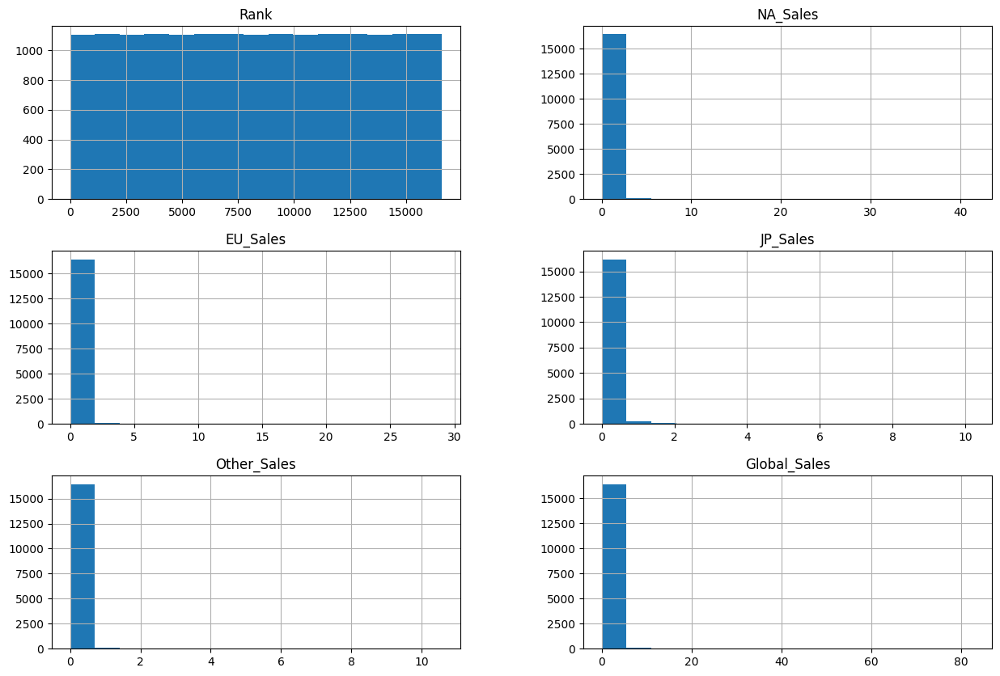

In [38]:
vg_merge.hist(bins=15, figsize=(15, 10))
plt.show()

Genre Breakdown:
* The genres in the video game industry seem to contain two big outliers: sports and action games. Together they make up almost 40% of the distribution of the top 16,500 video games titles. This will be something to hold onto as the analysis progresses.

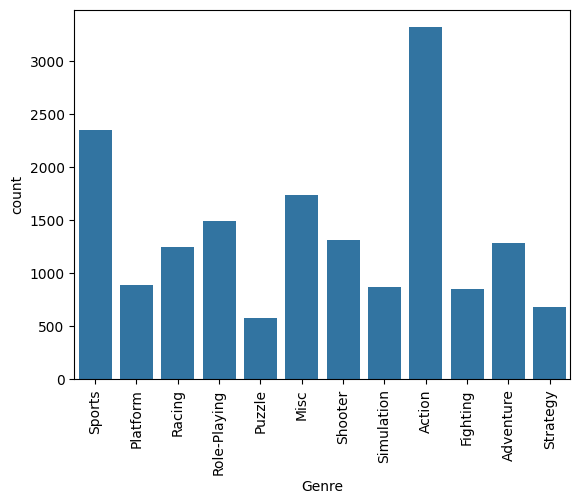

In [39]:
# Count plot for a categorical column
sns.countplot(x='Genre', data=vg_merge)
plt.xticks(rotation=90)
plt.show()

Platforms distribution:
* Platforms contain a high level of skewness. With the DS and PS2 consoles dominating the field, making up close to 30% of all titles in this dataset

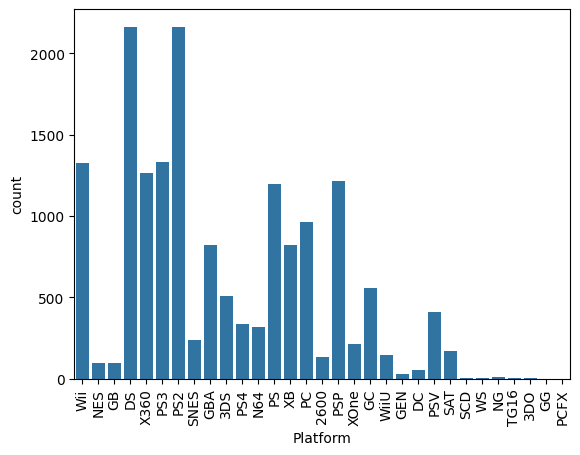

In [40]:
sns.countplot(x='Platform', data=vg_merge)
plt.xticks(rotation=90)
plt.show()

Pairplot viz:
* From the pariplot its easier to spot the outliers in the genre category.
* In most of there graphs three things should stand out, the orange and pink and the green dots much further above any other dot.
* These outliers reflect three of the most popular games (by far) across NA, EU, JP and the remainder of the gaming world. Pink is in reference to a sports game (Wii Sports), Orange is a platformer game (Super Mario Bros) and green is a role playing game (Pokemon Red/Pokemon Blue).
* Thus, this pairplot reflects just how far away these games are from the rest of the cohort.

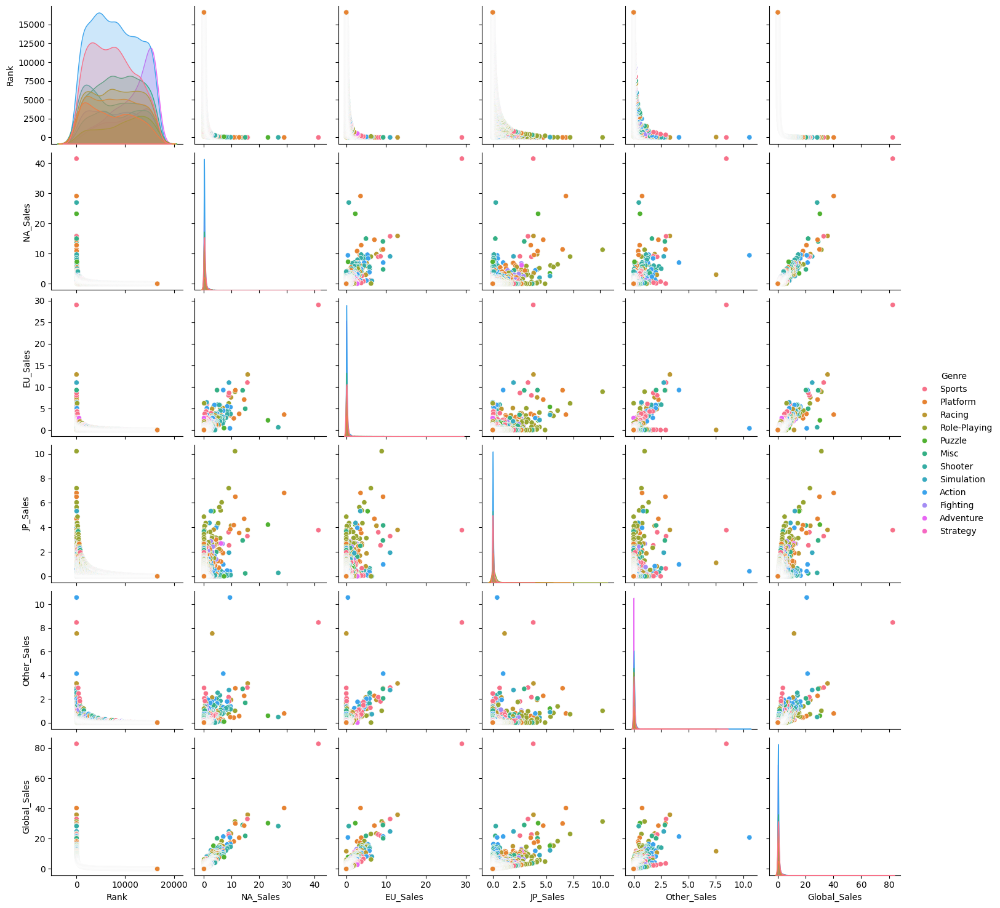

<Figure size 1200x800 with 0 Axes>

In [41]:
sns.pairplot(vg_merge, hue='Genre')
plt.figure(figsize=(12, 8))
plt.show()

The last bit of this EDA are how prevalent different platforms and publishers are across the top 20 games with the highest global sales.
* Bar none - Nintendo dominates global sales (Wii, DS, GB, NES, 3DS N64, etc.)
* The only other Platform to come close is PS2 and the original playstation

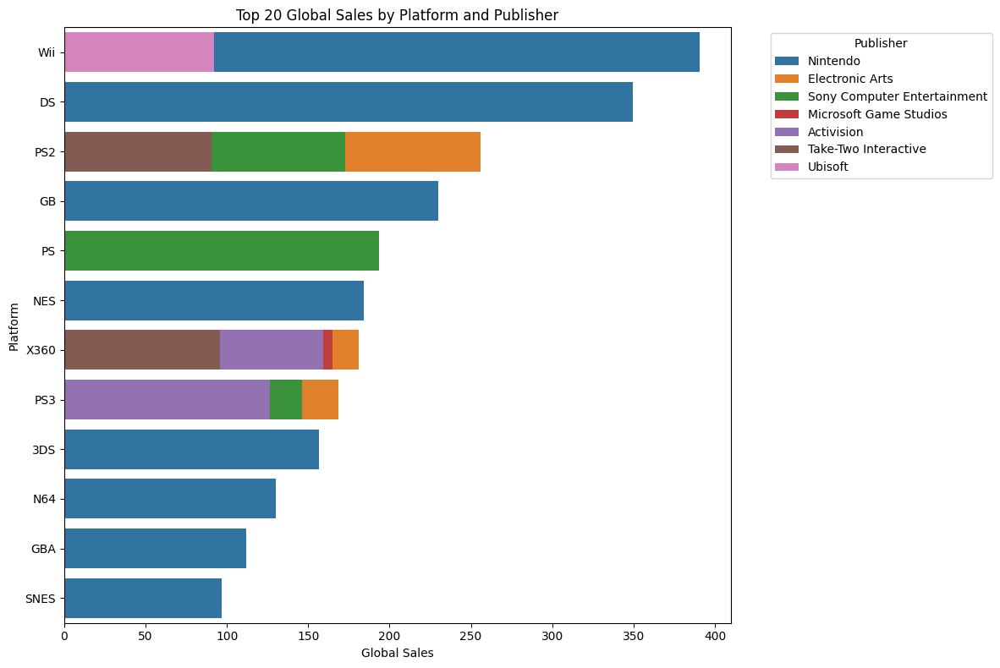

In [42]:

grouped_data = vg_merge.groupby(['Platform', 'Publisher'])['Global_Sales'].sum().reset_index()

top_20 = grouped_data.sort_values(by='Global_Sales', ascending=False).head(20)

# Step 4: Visualization
# Directly plotting the top 20 as a bar chart since it's a more suitable visualization for this scenario
plt.figure(figsize=(12, 8))
sns.barplot(x='Global_Sales', y='Platform', hue='Publisher', data=top_20, dodge=False)
plt.title("Top 20 Global Sales by Platform and Publisher")
plt.xlabel("Global Sales")
plt.ylabel("Platform")
plt.legend(title='Publisher', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [43]:
vg_merge

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Developer,Country,year_established
0,1,Wii Sports,Wii,2006,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74,Nintendo,Japan,1889
1,2,Super Mario Bros.,NES,1985,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24,Nintendo,Japan,1889
2,3,Mario Kart Wii,Wii,2008,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82,Nintendo,Japan,1889
3,4,Wii Sports Resort,Wii,2009,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00,Nintendo,Japan,1889
4,5,Pokemon Red/Pokemon Blue,GB,1996,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37,Nintendo,Japan,1889
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16593,16596,Woody Woodpecker in Crazy Castle 5,GBA,2002,Platform,Kemco,0.01,0.00,0.00,0.00,0.01,NaN,NaN,NaN
16594,16597,Men in Black II: Alien Escape,GC,2003,Shooter,Infogrames,0.01,0.00,0.00,0.00,0.01,NaN,NaN,NaN
16595,16598,SCORE International Baja 1000: The Official Game,PS2,2008,Racing,Activision,0.00,0.00,0.00,0.00,0.01,Activision,United States,1979
16596,16599,Know How 2,DS,2010,Puzzle,7G//AMES,0.00,0.01,0.00,0.00,0.01,NaN,NaN,NaN


In [44]:
platform_counts = vg_merge['Platform'].value_counts()
top_5_platforms = platform_counts.head(5).index
top_5_vg_merge = vg_merge[vg_merge['Platform'].isin(top_5_platforms)]

In [45]:
top_5_vg_merge

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Developer,Country,year_established
0,1,Wii Sports,Wii,2006,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74,Nintendo,Japan,1889
2,3,Mario Kart Wii,Wii,2008,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82,Nintendo,Japan,1889
3,4,Wii Sports Resort,Wii,2009,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00,Nintendo,Japan,1889
6,7,New Super Mario Bros.,DS,2006,Platform,Nintendo,11.38,9.23,6.50,2.90,30.01,Nintendo,Japan,1889
7,8,Wii Play,Wii,2006,Misc,Nintendo,14.03,9.20,2.93,2.85,29.02,Nintendo,Japan,1889
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16587,16590,Mezase!! Tsuri Master DS,DS,2009,Sports,Hudson Soft,0.00,0.00,0.01,0.00,0.01,Hudson Soft,Japan,1973
16588,16591,Mega Brain Boost,DS,2008,Puzzle,Majesco Entertainment,0.01,0.00,0.00,0.00,0.01,Majesco Entertainment,United States,1986
16592,16595,Plushees,DS,2008,Simulation,Destineer,0.01,0.00,0.00,0.00,0.01,NaN,NaN,NaN
16595,16598,SCORE International Baja 1000: The Official Game,PS2,2008,Racing,Activision,0.00,0.00,0.00,0.00,0.01,Activision,United States,1979


### Network Analysis:


In [46]:
# Calculate the mean global sales
mean_global_sales = top_5_vg_merge['Global_Sales'].mean()
print(mean_global_sales)

0.5996166444255733


### Biparite graph #1:
* This biparite graph looks at game titles, and platforms with the explicit goal of evaluating the top platforms and which games they share with other top platforms.
* Looking at the graph Xbox 360 and the PS3 are very interconnected, while the PS2 shares edges(games) with many more ps2 and xbox games than Wii or DS.
* Lastly, we see that Wii and DS share a lot of games but are also much more isolated from the other non-nintendo platforms.

In [47]:
# Get the games that appear on multiple platforms
game_platform_counts = top_5_vg_merge['Name'].value_counts()
multi_platform_games = game_platform_counts[game_platform_counts > 1].index

# Filter the DataFrame for these games
multi_platform_vg_merge = top_5_vg_merge[top_5_vg_merge['Name'].isin(multi_platform_games)]


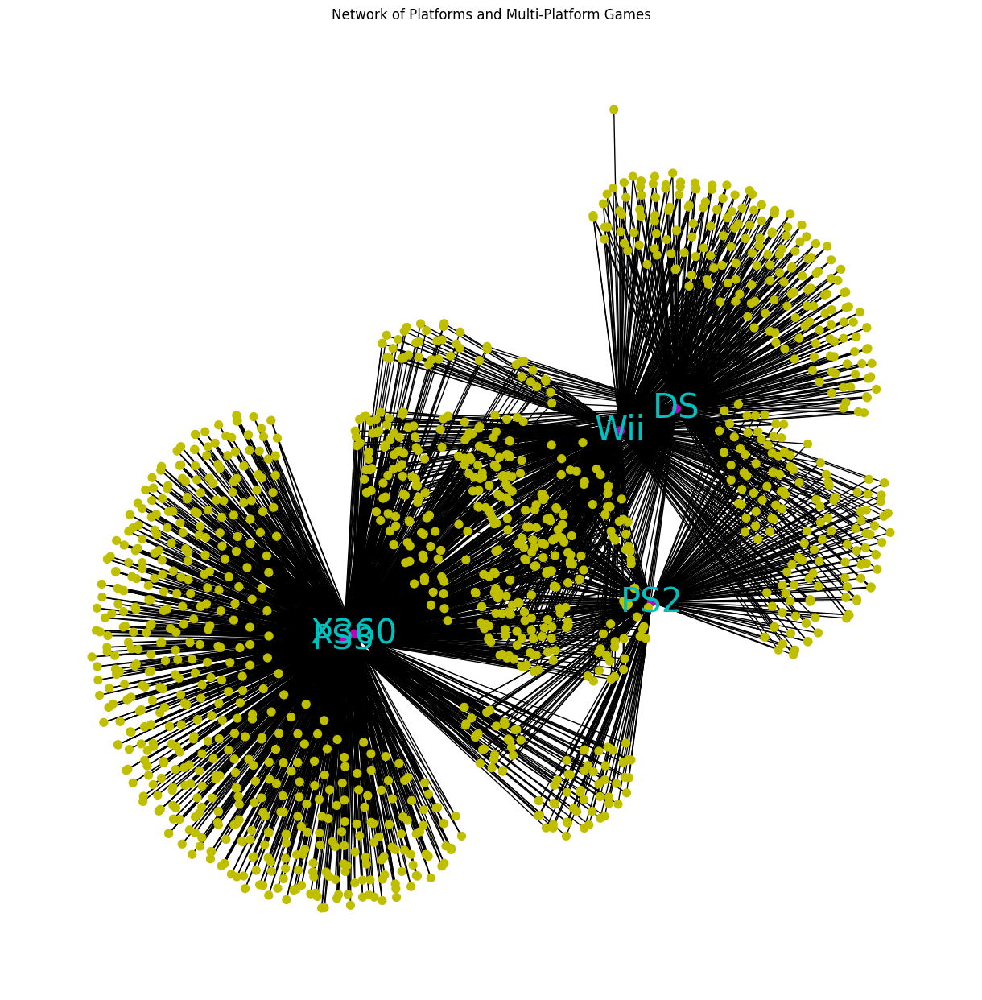

In [48]:
import networkx as nx
import matplotlib.pyplot as plt

# Create a bipartite graph
B = nx.Graph()

# Add nodes for platforms and multi-platform games
B.add_nodes_from(multi_platform_vg_merge['Platform'], bipartite=1)  # Platforms
B.add_nodes_from(multi_platform_vg_merge['Name'], bipartite=0)  # Games

# Add edges between games and platforms
for _, row in multi_platform_vg_merge.iterrows():
    B.add_edge(row['Name'], row['Platform'])

# Visualize the bipartite graph with labels only for top 5 platforms
pos = nx.spring_layout(B)
plt.figure(figsize=(12, 12))

# Determine which nodes to label (only those in top_5_platforms)
labels = {node: node if node in top_5_platforms else '' for node in B.nodes()}

nx.draw(B, pos, with_labels=True, labels=labels, node_color=['m' if node in top_5_platforms else 'y' for node in B.nodes()], font_size=30, node_size=50, font_color='c')
plt.title('Network of Platforms and Multi-Platform Games')
plt.show()

In [49]:
# Calculate the mean global sales
mean_global_sales_twoplus = multi_platform_vg_merge['Global_Sales'].mean()
print(mean_global_sales_twoplus)

0.6821259370314843


### Biparite Graph #2
* In this biparite graph we evaluate the games with more than 2 platforms associated with the game.
* Increasing the number of edges shared between games helps to pair down the network, looking for highly connected games.
* By density alone it looks like as the games increase edges the Wii starts to share many more games with Xbox360 and PS3, while the PS2 and DS's become much less prominent in this particular network.
* This is likely due to new age games at the time (Wii, PS3 and Xbox) having more techonological capabilites in terms of cross compatability. As a result we see older systems like DS and PS2 phasing out game production.

In [50]:
# Get the games that appear on multiple platforms
game_platform_counts = top_5_vg_merge['Name'].value_counts()
threeplus_platform_games = game_platform_counts[game_platform_counts > 2].index

# Filter the DataFrame for these games
threeplus_platform_vg_merge = top_5_vg_merge[top_5_vg_merge['Name'].isin(threeplus_platform_games)]


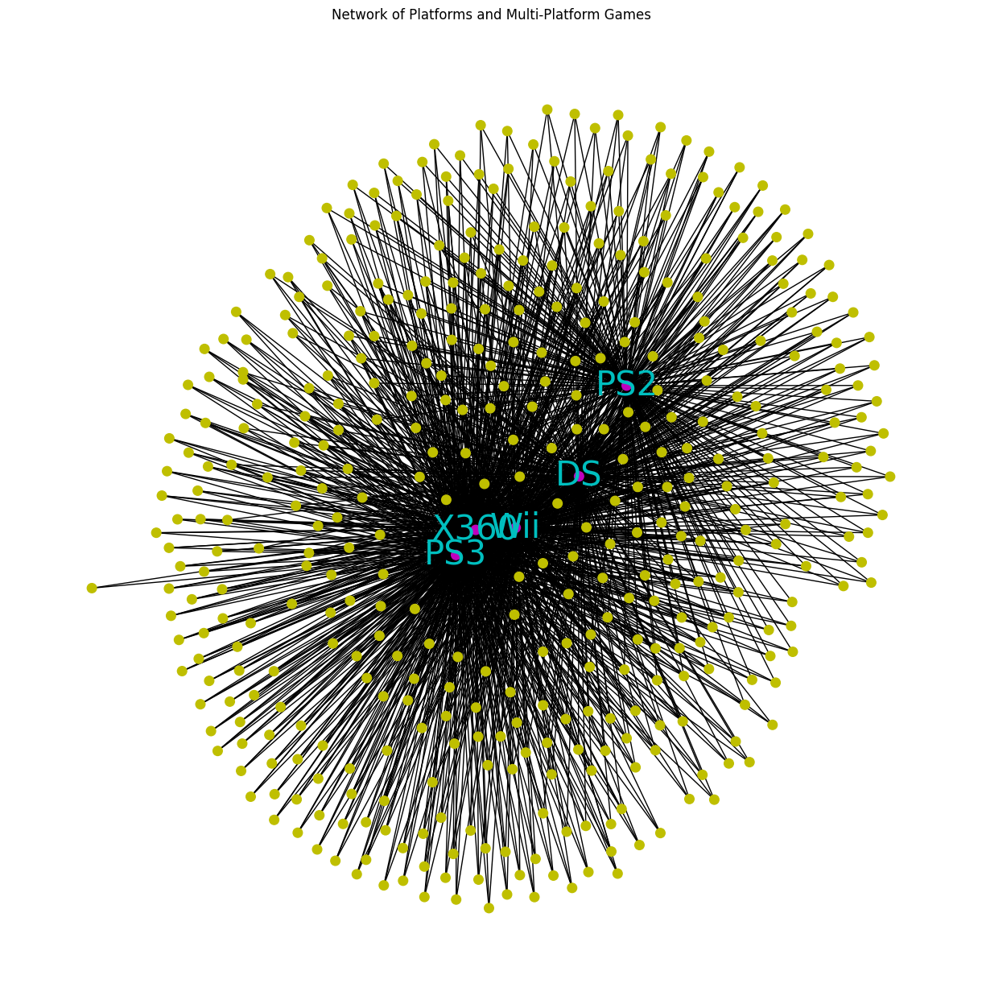

In [51]:
import networkx as nx
import matplotlib.pyplot as plt

# Create a bipartite graph
B = nx.Graph()

# Add nodes for platforms and multi-platform games
B.add_nodes_from(threeplus_platform_vg_merge['Platform'], bipartite=1)  # Platforms
B.add_nodes_from(threeplus_platform_vg_merge['Name'], bipartite=0)  # Games

# Add edges between games and platforms
for _, row in threeplus_platform_vg_merge.iterrows():
    B.add_edge(row['Name'], row['Platform'])

# Visualize the bipartite graph with labels only for top 5 platforms
pos = nx.spring_layout(B)
plt.figure(figsize=(12, 12))

# Determine which nodes to label (only those in top_5_platforms)
labels = {node: node if node in top_5_platforms else '' for node in B.nodes()}

nx.draw(B, pos, with_labels=True, labels=labels, node_color=['m' if node in top_5_platforms else 'y' for node in B.nodes()], font_size=30, node_size=70, font_color='c')
plt.title('Network of Platforms and Multi-Platform Games')
plt.show()

### Centrality Breakdown between games and platforms
* Degree
* Betweeness
* Closeness

In [52]:
import matplotlib.pyplot as plt
import pandas as pd
import networkx as nx

# Create a bipartite graph
B = nx.Graph()

# Add nodes for games and platforms
B.add_nodes_from(top_5_vg_merge['Name'], bipartite=0)  # Games
B.add_nodes_from(top_5_vg_merge['Platform'], bipartite=1)  # Platforms

# Add edges between games and platforms
for _, row in top_5_vg_merge.iterrows():
    B.add_edge(row['Name'], row['Platform'])

# Calculate centrality measures
degree_centrality = nx.degree_centrality(B)
betweenness_centrality = nx.betweenness_centrality(B)
closeness_centrality = nx.closeness_centrality(B)

# Separate games and platforms
games = top_5_vg_merge['Name'].values
platforms = top_5_vg_merge['Platform'].values

# Helper function to get centrality values
def get_centrality_values(nodes, centrality):
    return {node: centrality[node] for node in nodes}

# Get centrality values for games and platforms
game_degree_centrality = get_centrality_values(games, degree_centrality)
game_betweenness_centrality = get_centrality_values(games, betweenness_centrality)
game_closeness_centrality = get_centrality_values(games, closeness_centrality)

platform_degree_centrality = get_centrality_values(platforms, degree_centrality)
platform_betweenness_centrality = get_centrality_values(platforms, betweenness_centrality)
platform_closeness_centrality = get_centrality_values(platforms, closeness_centrality)


In [53]:
# Create dataframes for visualization
# Create DataFrame
df_game_centrality = pd.DataFrame({
    'Name': games,
    'Degree Centrality': [game_degree_centrality[game] for game in games],
    'Betweenness Centrality': [game_betweenness_centrality[game] for game in games],
    'Closeness Centrality': [game_closeness_centrality[game] for game in games]
})
df_platform_centrality = pd.DataFrame({
    'Degree Centrality': platform_degree_centrality,
    'Betweenness Centrality': platform_betweenness_centrality,
    'Closeness Centrality': platform_closeness_centrality
})

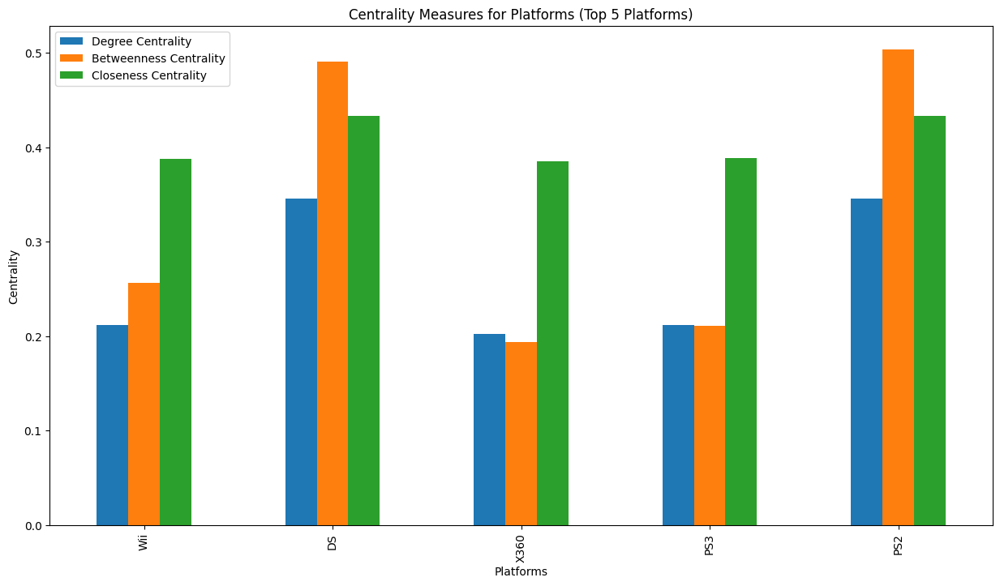

In [54]:
# Plot centrality measures for platforms
df_platform_centrality.plot(kind='bar', figsize=(15, 8))
plt.title('Centrality Measures for Platforms (Top 5 Platforms)')
plt.xlabel('Platforms')
plt.ylabel('Centrality')
plt.xticks(rotation=90)
plt.show()

In [55]:
df_game_centrality

,Name,Degree Centrality,Betweenness Centrality,Closeness Centrality
0,Wii Sports,0.00016,0.000000,0.279680
1,Mario Kart Wii,0.00016,0.000000,0.279680
2,Wii Sports Resort,0.00016,0.000000,0.279680
3,New Super Mario Bros.,0.00016,0.000000,0.302385
4,Wii Play,0.00016,0.000000,0.279680
...,...,...,...,...
8238,Mezase!! Tsuri Master DS,0.00016,0.000000,0.302385
8239,Mega Brain Boost,0.00016,0.000000,0.302385
8240,Plushees,0.00016,0.000000,0.302385
8241,SCORE International Baja 1000: The Official Game,0.00064,0.001249,0.393106


In [56]:
centrality_globalsales = pd.merge(df_game_centrality, vg_merge, on='Name', how='left')

### Centrality measures against global sales
* While the graphs look slightly different, one trend is prominent. Being unique (low centrality as a proxy) among other games is beneficial in this industry.
* The outlier in all three centrality measures is Wii Sports, this 1:1 game retains low contrality across all measures but has sold 82 million copies regardless.

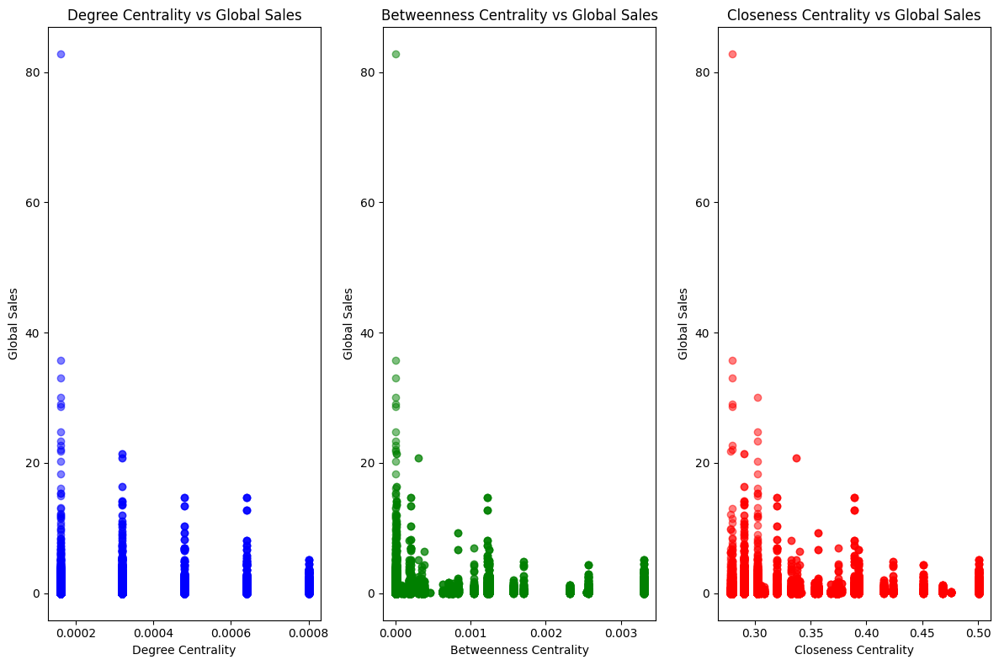

In [57]:
# Plot Degree Centrality vs Global Sales
plt.figure(figsize=(12, 8))

plt.subplot(1, 3, 1)
plt.scatter(centrality_globalsales['Degree Centrality'], centrality_globalsales['Global_Sales'], c='blue', alpha=0.5)
plt.title('Degree Centrality vs Global Sales')
plt.xlabel('Degree Centrality')
plt.ylabel('Global Sales')

# Plot Betweenness Centrality vs Global Sales
plt.subplot(1, 3, 2)
plt.scatter(centrality_globalsales['Betweenness Centrality'], centrality_globalsales['Global_Sales'], c='green', alpha=0.5)
plt.title('Betweenness Centrality vs Global Sales')
plt.xlabel('Betweenness Centrality')
plt.ylabel('Global Sales')

# Plot Closeness Centrality vs Global Sales
plt.subplot(1, 3, 3)
plt.scatter(centrality_globalsales['Closeness Centrality'], centrality_globalsales['Global_Sales'], c='red', alpha=0.5)
plt.title('Closeness Centrality vs Global Sales')
plt.xlabel('Closeness Centrality')
plt.ylabel('Global Sales')

plt.tight_layout()
plt.show()

In [58]:
# Create the three DataFrames with the 'Name' column and one centrality measure column each
df_degree = centrality_globalsales[['Name', 'Degree Centrality']]
df_betweenness = centrality_globalsales[['Name', 'Betweenness Centrality']]
df_closeness = centrality_globalsales[['Name', 'Closeness Centrality']]

In [59]:
# Sort each DataFrame by its centrality measure in decreasing order and remove duplicates
df_degree_sorted = df_degree.sort_values(by='Degree Centrality', ascending=False).drop_duplicates(subset='Name').head(20)
df_betweenness_sorted = df_betweenness.sort_values(by='Betweenness Centrality', ascending=False).drop_duplicates(subset='Name').head(20)
df_closeness_sorted = df_closeness.sort_values(by='Closeness Centrality', ascending=False).drop_duplicates(subset='Name').head(20)

### Community detection among game titles, platforms, genres and publishers:
* The community detection was generated throught the use of the louvain algorithm in network x.
* From there there communities were graphed on three different relationships.
1. Games and Platforms
2. Genre and Games
3. Publisher and Games


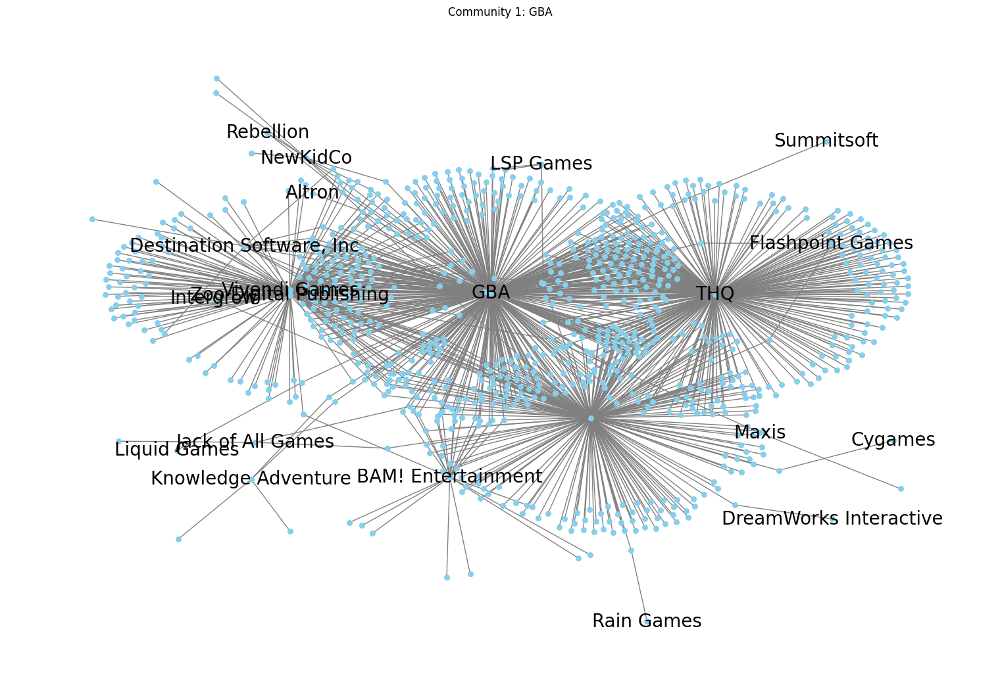

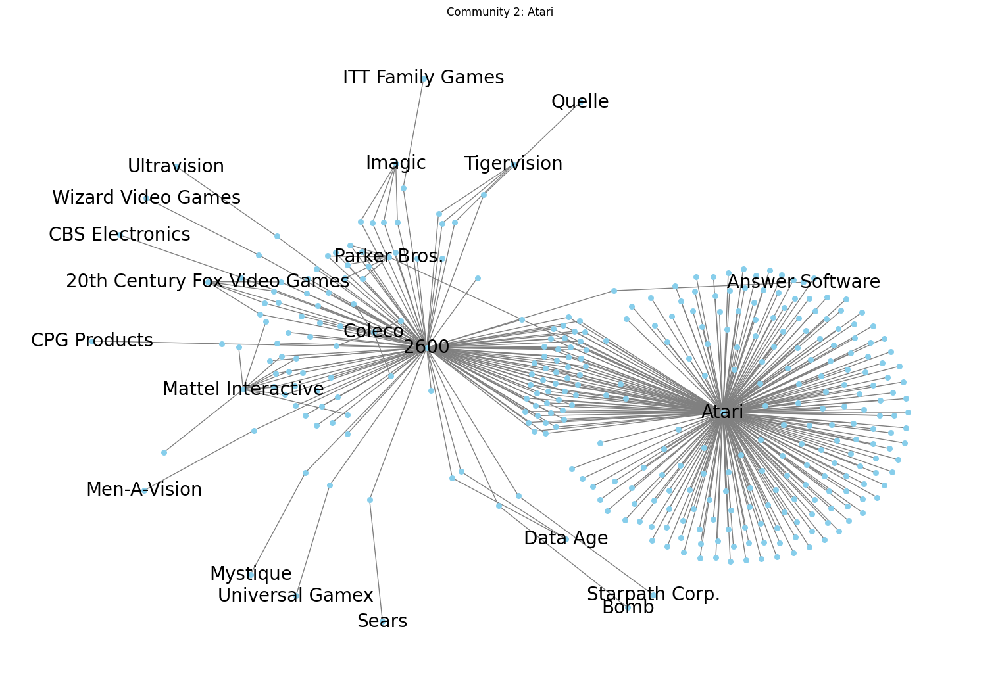

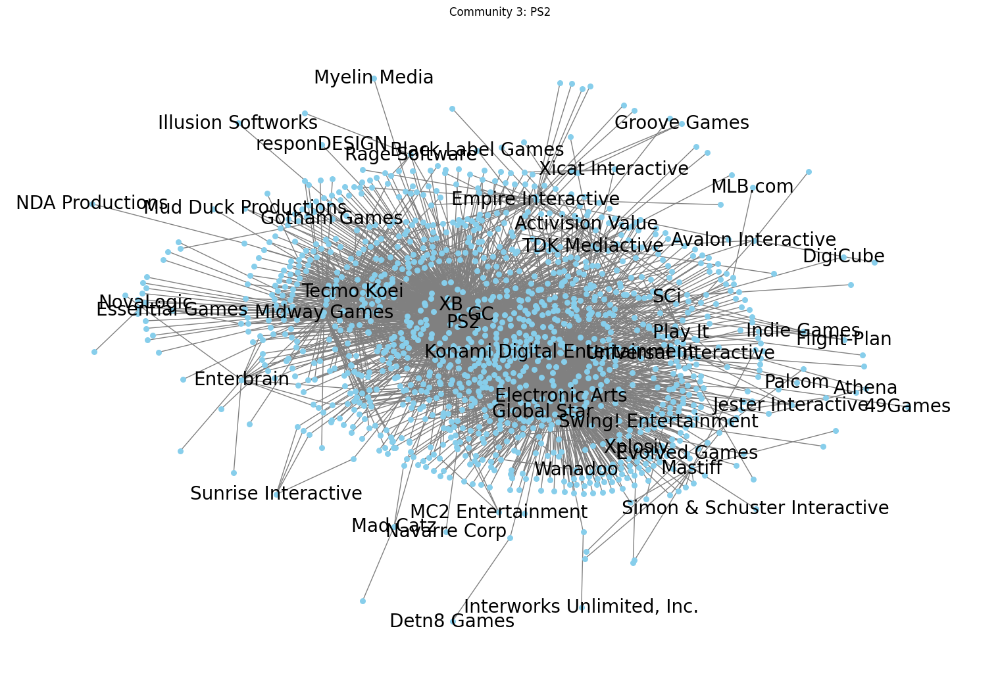

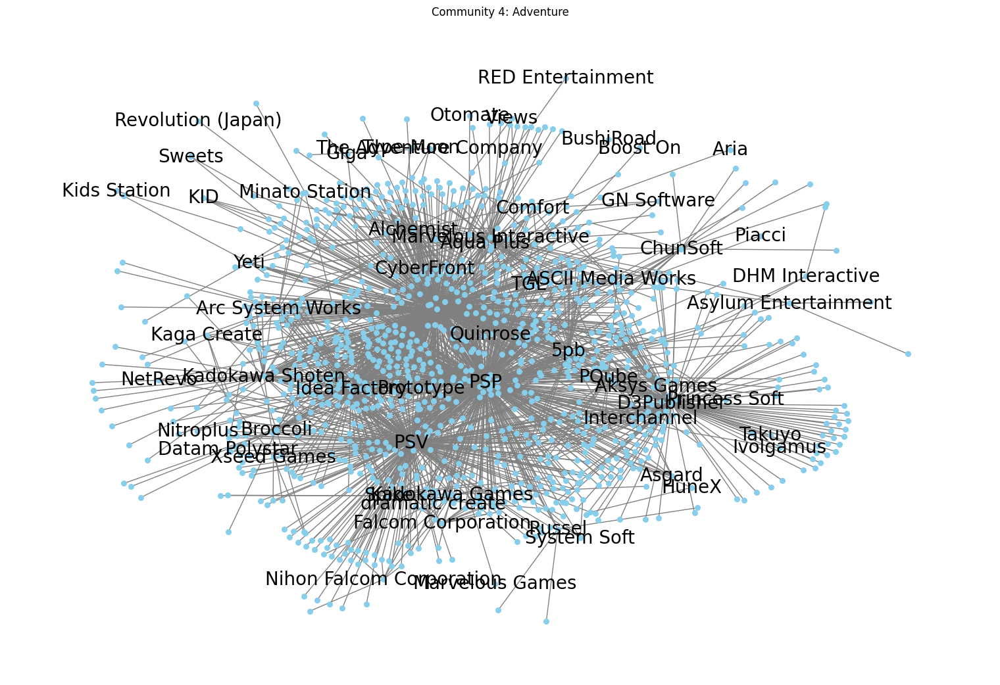

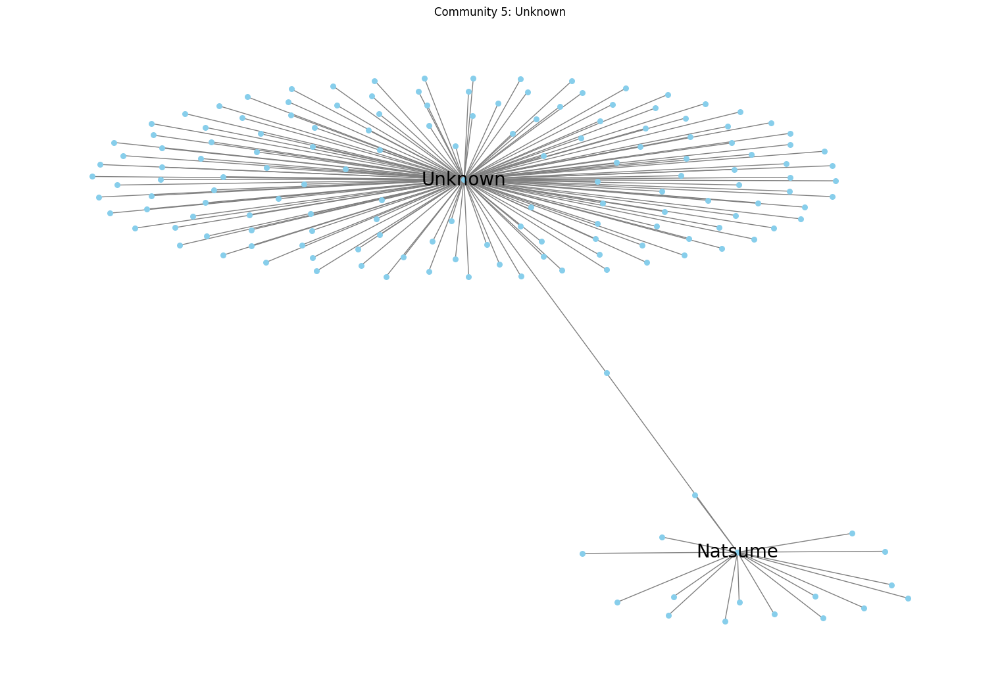

...

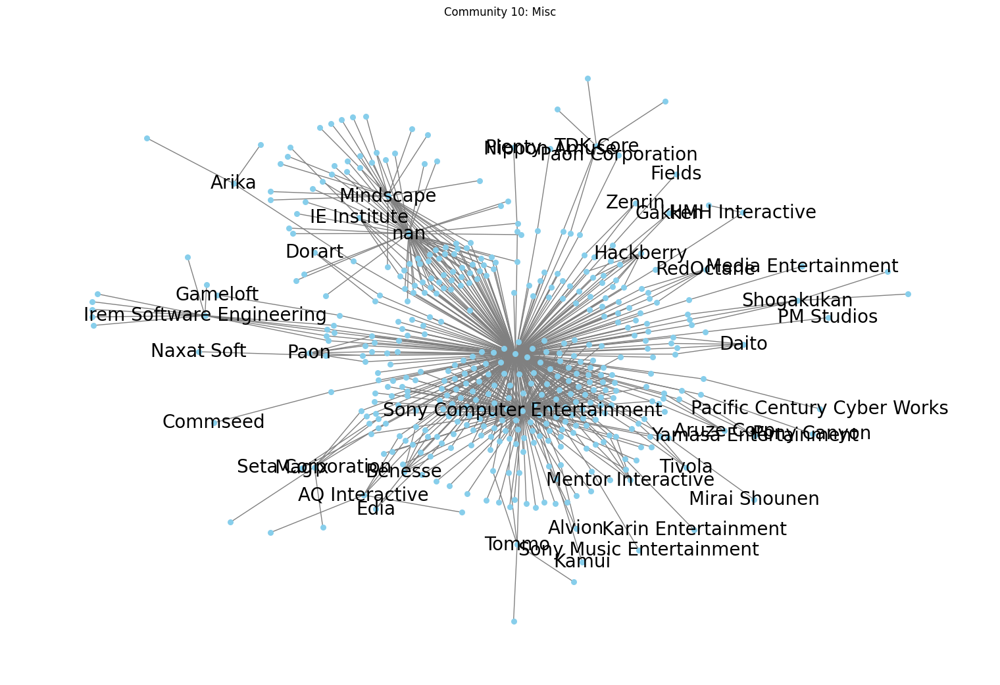

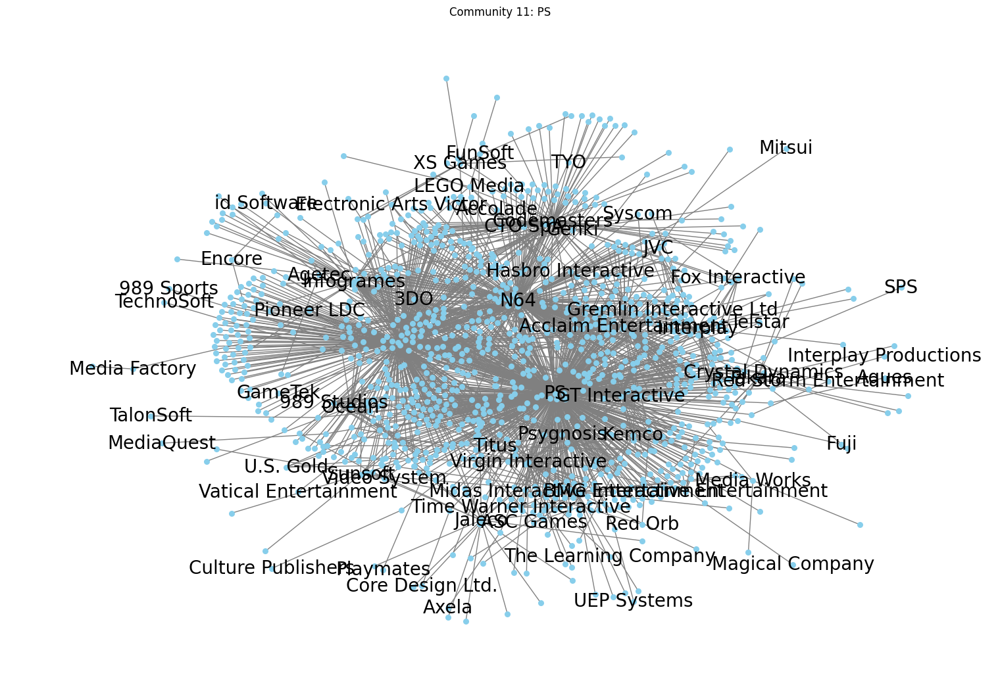

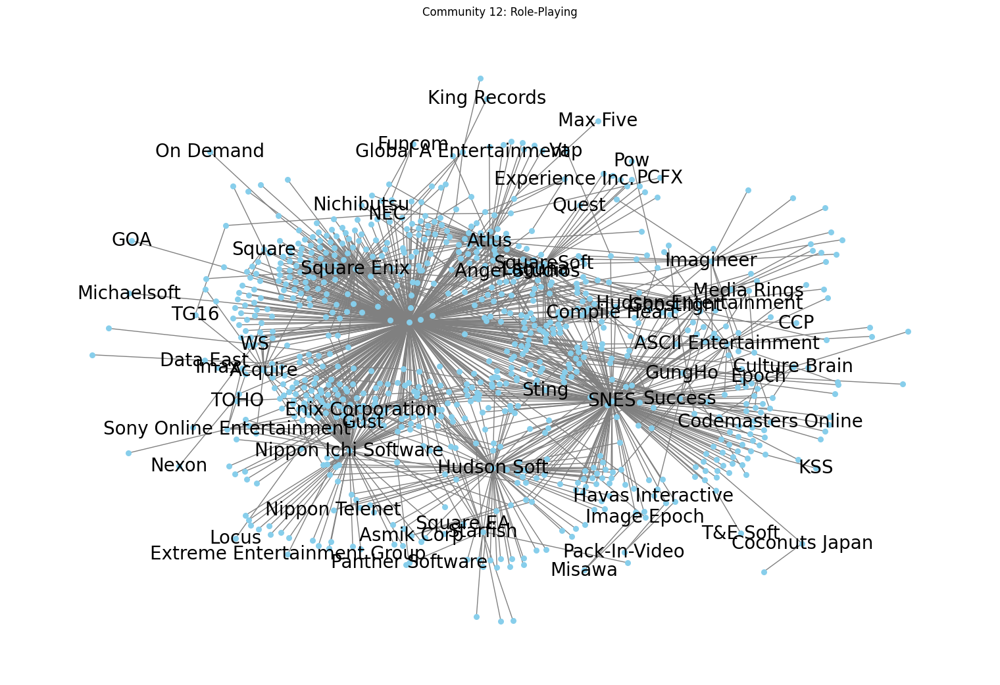

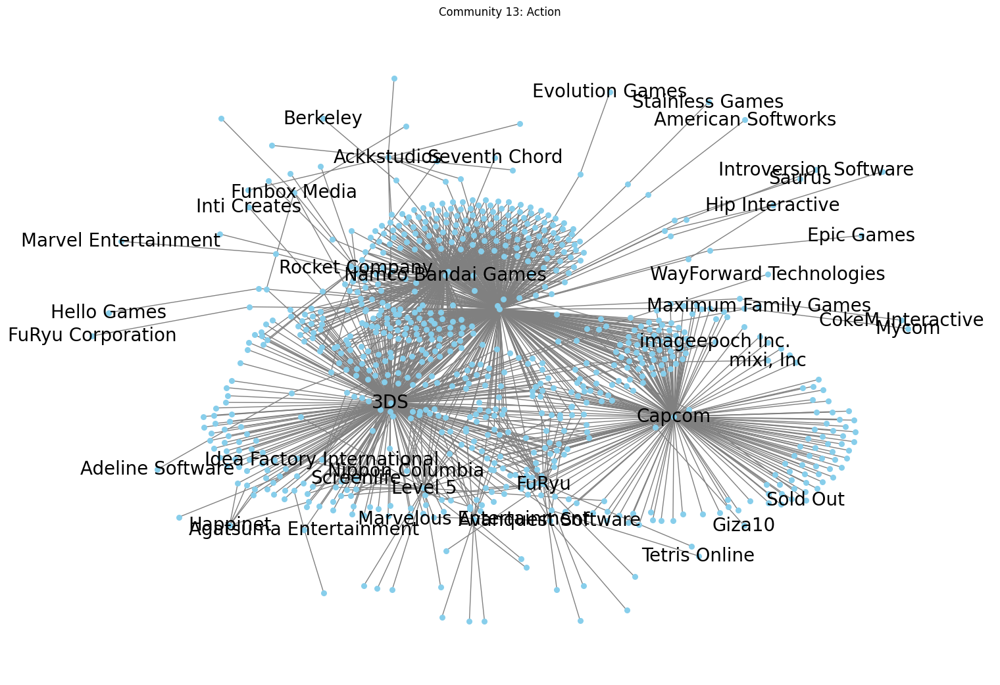

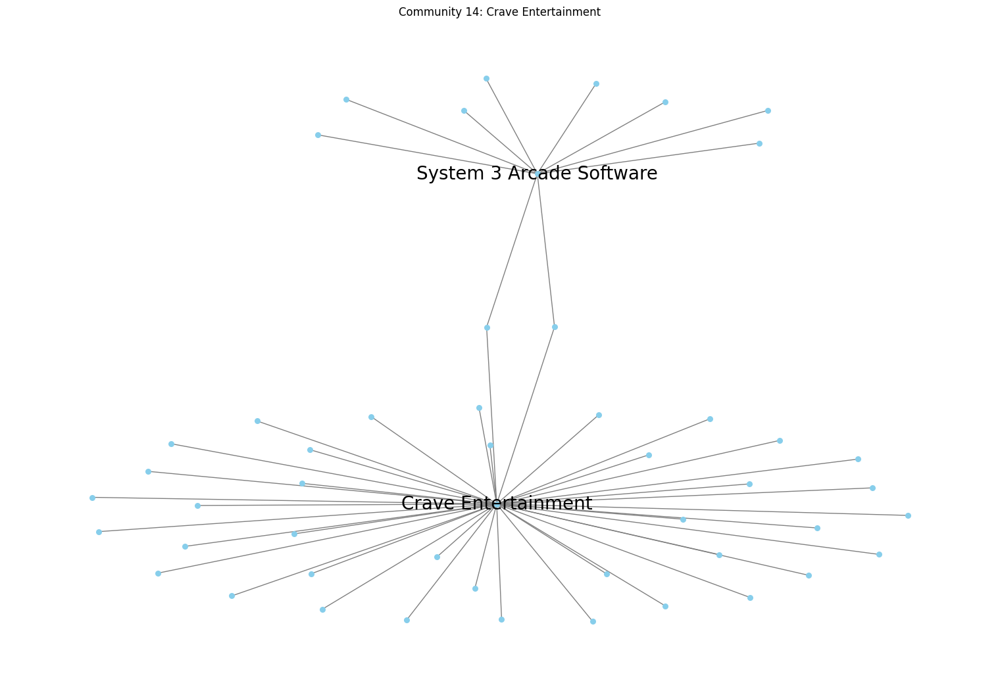

In [68]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from networkx.algorithms.community import louvain_communities

# Select relevant columns for network analysis
vis_data = vg_merge[['Name', 'Platform', 'Genre', 'Publisher']]

# Create a graph
G = nx.Graph()

for _, row in vis_data.iterrows():
    G.add_node(row['Name'], type='game')
    G.add_node(row['Platform'], type='platform')
    G.add_edge(row['Name'], row['Platform'])

# Add nodes and edges for Genre relationships
for _, row in vis_data.iterrows():
    G.add_node(row['Genre'], type='genre')
    G.add_edge(row['Name'], row['Genre'])

# Add nodes and edges for Publisher relationships
for _, row in vis_data.iterrows():
    G.add_node(row['Publisher'], type='publisher')
    G.add_edge(row['Name'], row['Publisher'])


# Detect communities using the Louvain method
communities = louvain_communities(G)

# Function to get the node with the highest degree centrality in a community
def get_central_node(subgraph):
    centrality = nx.degree_centrality(subgraph)
    return max(centrality, key=centrality.get)

# Plot each community separately
for i, community in enumerate(communities):
    plt.figure(figsize=(15,10))
    subgraph = G.subgraph(community)
    pos = nx.spring_layout(subgraph, k=0.15)
    
    # Prepare labels for only platforms or publishers
    labels = {node: node for node, attrs in subgraph.nodes(data=True) if attrs['type'] in ['platform', 'publisher']}
    
    nx.draw(subgraph, pos, with_labels=False, node_size=30, node_color="skyblue", font_size=15, font_color="black", edge_color="gray")
    nx.draw_networkx_labels(subgraph, pos, labels=labels, font_size=20, font_color="black")
    
    # Label each community with the central node's name
    central_node = get_central_node(subgraph)
    plt.title(f"Community {i + 1}: {central_node}")
    
    plt.show()

Conclusion:
* The video game industry is an oligopoly, with the top 20 highest selling games coming from a handful of Publishing Companies.
* The industry is dominated by a few large companies that own many of the top publishers and is dominated by a few large games that have sold tens of millions of copies.
* Exclusivity is a trait of some of the top selling games, Nintendo is adept at this, even in 2024 Nintendo sells console exclusives, just like they have been doing since the 60's.
* The industry is dominated by a few large genres that have many games in common.
* The industry is dominated by a few large communities of games, platforms, genres, and publishers that have many games in common.
    * Publishing companies like Microsoft, Tencent and Take-Two Interactive are notorious for just swallowing smaller publishers and game studios to keep and expand their market space.
    * In October of 2023, Microsoft outright bought Activision Blizzard, which stems from a previous purchase of Blizzard by Activision in 2008, when the companies merged they began producing some of the largest games across several genres for a range of platforms.

Future Research:
* Looking at the data it seems like exclusivity could play an important role in earnings..
* The data also shows that unique games tend to sell better than games that are similar to other games. Further research in this area could be beneficial.
* The data also shows that unique games tend to have lower centrality measures than games that are similar to other games.

Limitations:
* There are a few limitations to this research. And the most glaring one is the fact that the two highest selling games by far are not included or do not have the correct copies sold.
* The two largest ones are Tetris at 550 million copies sold and Minecraft at 330 million. Numbers that would blow Wii Sports out of the water. But the link did not say why those two were left out, so this can be an avenue for further research too.
* Secondly, there have been massive moves in the gaming industry that would shake up the breakdowns we created (Activision acquisition, etc)
* Lastly is the recency issue of the data (a newer set of data might fix these issues I mentioned above)



### References:
* https://www.kaggle.com/datasets/gregorut/videogamesales
* https://www.kaggle.com/datasets/andreshg/videogamescompaniesregions?select=video-games-developers.csv


### Note:
* The code for this project can be found in the following github repository: